# Segmentation Exudatae, Red Dot（+MA） and Hemorrage from IDRiD dataset and DIARETDB1

#### Compiler (Adam)
#### Learning rate (0.00005)
#### Accuracy metric: Dice coefficient [9] to be maximized
#### Loss metric: negative Dice coefficient (to be minimized)

In [3]:
from matplotlib import pyplot as plt
from tensorflow import keras

import tensorflow as tf
import pandas as pd
import numpy as np
import random
import math
import keras.backend as K

import cv2
import os

WIDTH, HEIGHT = 512, 512
# NUM_CLASSES = 3 # 0. Background, 1, Exudatas(Hard + Soft), 2. Red Dot + Hemorrhages + Microaneurysms
BATCH_SIZE = 1


EPOCHS = 100# 50


MODEL_DIR = "./Diabetic Retinopathy1/"# "C:/Users/yhu04/Diabetic Retinopathy/"
BASE_DIR = "./DR_data3/"
psi = [1]*5
NUM_CLASSES = 3# 3

def visualize(temp, plot=True):
    r = temp.copy()
    g = temp.copy()
    b = temp.copy()
    for l in range(0,3):
        r[temp==l]=label_colours[l,0]
        g[temp==l]=label_colours[l,1]
        b[temp==l]=label_colours[l,2]

    rgb = np.zeros((temp.shape[0], temp.shape[1], 3))
    rgb[:,:,0] = (r/255.0)#[:,:,0]
    rgb[:,:,1] = (g/255.0)#[:,:,1]
    rgb[:,:,2] = (b/255.0)#[:,:,2]
    if plot:
        plt.imshow(rgb)
    else:
        return rgb

In [4]:
import skimage.io as io
import skimage.transform as trans
import numpy as np
from tensorflow.keras.models import *
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *
from tensorflow.keras.callbacks import ModelCheckpoint, LearningRateScheduler
from tensorflow.keras import backend as K
import tensorflow as tf

In [8]:
def mask_softmax(x,mask):
    logits = tf.exp(x) * mask / tf.reduce_sum(tf.exp(x) * mask)
#     print(logits)
    return logits

In [9]:
# train_label = [0,1]
img = tf.keras.Input(shape=(512, 512, 3), name="Image")
grad = [2]
def LabelGenerator(x,y,class_nb = psi,num_classes = NUM_CLASSES,batch_size = BATCH_SIZE,scope='grad',is_training=True, reuse=None,):
   
    filters = [32,64,128,256,256]
#     x = np.reshape(x, ((batch_size,) + x.shape))
#     print("encoder:",input_image.shape)# encoder: (None, 1024, 1024, 3)
    output_list = get_backbone()(x, training = False)  
    output = output_list[0]# 即fin_output
    
    outC = keras.layers.MaxPool2D(16,16)(output)
    outC = keras.layers.Flatten(name='ccflatten')(outC)
    outC = keras.layers.Dense(units=16)(outC)
    outC = keras.layers.ReLU()(outC)
    outC = keras.layers.Dense(units=int(np.sum(psi)),activation="softmax",name=f"classfc")(outC)
    
    
    index = tf.zeros([len(class_nb),np.sum(class_nb)]) + 1e-8
    index = index.numpy()
    
    for i in range(len(class_nb)):
        index[i, int(np.sum(class_nb[:i])):np.sum(class_nb[:i+1])] = 1
    
    index = tf.convert_to_tensor(index)
#     print(index)
#     print(y)# [3]
    mask = index[y]
#     print(mask)# tf.Tensor([1.e-08 1.e-08 1.e-08 1.e+00 1.e-08], shape=(5,), dtype=float32) grad=[3]
    
    
    classifier = tf.keras.models.Sequential([
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(filters[-1]),
        tf.keras.layers.ReLU(),
        tf.keras.layers.Dense(filters[-1]),
        
    ])
    
#     predict.shape (1, 512)
#     mask.shape (5,)
#     print("outC.shape",outC.shape)
    label_pred = mask_softmax(outC, mask)
#     print(label_pred.shape)# (None, 5)


    return label_pred

backbone_name = "VGG16"
unet_vgg16 = Unet()
unet_vgg16.summary()

# 2. Loss Function
#### 2.1. Dice Loss
#### 2.2. IoU ( Jaccard Loss)
#### 2.3. Categorical Focal Loss + Dice Loss
#### 2.4. Categorical Focal Loss + Jaccard Loss

In [10]:
def Dice(y_true, y_pred, solo = True, num_classes = NUM_CLASSES):
    """
    Dice
    
    Dice = 2TP / (2TP + FP + FN) = 2|X∩Y| / (|X| + |Y|) 
         = sum(2 X*Y) / (sum(X) +sum(Y))
    """ 
    smooth = 0.0001# 0.0001
    if solo:
        y_true = tf.one_hot(tf.cast(y_true, dtype=tf.int32),
                            depth=num_classes,
                            dtype=tf.float32,
                            )
    numerator = 2 * tf.reduce_sum(y_true * y_pred)
    denominator = tf.reduce_sum(y_true + y_pred)
    return (numerator + smooth) / (denominator + smooth)

In [11]:
def Dice_class(y_true, y_pred, solo = True, num_classes = 5):
    smooth = 0.0001# 0.0001
    if solo:
        y_true = tf.one_hot(tf.cast(y_true, dtype=tf.int32),
                            depth=num_classes,
                            dtype=tf.float32,
                            )
        
    numerator = 2 * tf.reduce_sum(y_true * y_pred)
    denominator = tf.reduce_sum(y_true + y_pred)
    return (numerator + smooth) / (denominator + smooth)

In [12]:
def Jaccard(y_true, y_pred, solo = True, num_classes = 3):
    """
    Jaccard
    
    IoU = TP / (TP + FP + FN) = |X∩Y| / ( |X| + |Y| - |X∩Y| )
        = sum(A*B) / (sum(A)+sum(B)-sum(A*B))
    """
    smooth = 0.0001
    if solo:
        y_true = tf.one_hot(tf.cast(y_true, dtype=tf.int32),
                            depth=num_classes,
                            dtype=tf.float32,
                            )
    intersection = tf.reduce_sum(y_true * y_pred, axis=-1)
    sum_ = tf.reduce_sum(y_true + y_pred, axis=-1)
    return ((intersection + smooth) / (sum_ - intersection + smooth))

In [13]:
def Classify_ac(y_true, y_pred,solo = True, num_classes = 5):
    if solo:
        y_true = tf.one_hot(tf.cast(y_true, dtype=tf.int32),
                            depth=num_classes,
                            dtype=tf.float32,
                            )
    correct_predict = tf.equal(tf.argmax(y_pred, 0), tf.argmax(y_true, 0))
    accuracy = tf.reduce_mean(tf.cast(correct_predict, 'float'))
    return accuracy

In [14]:
class CategoricalFocalLoss(tf.losses.Loss):
  
    def __init__(self, solo = True, num_classes = NUM_CLASSES, gamma = 3.0, alpha=0.25):
        super(CategoricalFocalLoss, self).__init__(reduction = 'auto', name = "CategoricalFocalLoss")
        self._num_classes = num_classes
        self._gamma = gamma
        self._alpha = alpha
        self._epsilon = 1e-07
        self.solo = solo
        
        

    def call(self, y_true, y_pred):# cc那分类的呢？
      
        if self.solo:
            y_true = tf.one_hot(tf.cast(y_true, dtype=tf.int32),
                                depth=self._num_classes,
                                dtype=tf.float32,
                                )
         
        y_pred = tf.clip_by_value(y_pred, self._epsilon, 1.0 - self._epsilon)
        loss = - y_true * self._alpha * tf.math.pow((1 - y_pred), self._gamma) * tf.math.log(y_pred)
  
        return tf.reduce_mean(loss)



In [15]:
class CategoricalFocalLoss2(tf.losses.Loss):
    """
    公式 : loss = - y_true * alpha * ((1 - y_pred)^gamma) * log(y_pred)
        
    alpha: the same as weighting factor in balanced cross entropy, default 0.25
    gamma: focusing parameter for modulating factor (1-p), default 2.0

    y_true =  [[0., 1.0, 0.], [0., 0., 1.], [0., 1., 0.]]
    y_pred = [[0.70, 0.15, 0.15], [0.1, 0.8, 0.1], [0.25, 0.65, 0.1]]
    y_true = tf.cast(y_true, dtype= "float32")
    y_pred = tf.cast(y_pred, dtype= "float32")
    gamma=3.0
    alpha=0.25
    """
    def __init__(self, solo = True, num_classes = 5, gamma = 2.0, alpha=0.25):
        super(CategoricalFocalLoss2, self).__init__( name = "CategoricalFocalLoss2")# reduction = 'auto',
        self._num_classes = num_classes
        self._gamma = gamma
        self._alpha = alpha
        self._epsilon = 1e-07
        self.solo = solo
        
        

    def call(self, y_true, y_pred):# cc那分类的呢？
      
        if self.solo:
            y_true = tf.one_hot(tf.cast(y_true, dtype=tf.int32),
                                depth=self._num_classes,
                                dtype=tf.float32,
                                )
         
        y_pred = tf.clip_by_value(y_pred, self._epsilon, 1.0 - self._epsilon)
        loss = - y_true * self._alpha * tf.math.pow((1 - y_pred), self._gamma) * tf.math.log(y_pred)
        """
        Another Code
        alpha = tf.where(tf.equal(y_true, 1.), alpha, (1.0 - self._alpha))
        pt = tf.where(tf.equal(y_true, 1.), y_pred, 1-y_pred)
        y_pred = tf.add(y_pred, self._epsilon)
        loss = alpha * tf.pow(1.0 - pt, self._gamma) * tf.multiply(y_true, -tf.math.log(y_pred))
        """
#      
        return tf.reduce_mean(loss)


In [16]:
def generalized_dice_coef_fun(smooth=0, solo=True):
    def generalized_dice(y_true, y_pred):
        # Compute weights: "the contribution of each label is corrected by the inverse of its volume"
        if solo:
            y_true = tf.one_hot(tf.cast(y_true, dtype=tf.int32),
                                depth=NUM_CLASSES,
                                dtype=tf.float32,
                                )
        w = K.sum(y_true, axis=(0, 1, 2))
        w = 1 / (w ** 2 + 0.00001)
        # w为各个类别的权重，占比越大，权重越小
        # Compute gen dice coef:
        numerator = y_true * y_pred
        numerator = w * K.sum(numerator, axis=(0, 1, 2))
        numerator = K.sum(numerator)
 
        denominator = y_true + y_pred
        denominator = w * K.sum(denominator, axis=(0, 1, 2))
        denominator = K.sum(denominator)
 
        gen_dice_coef = numerator / denominator
 
        return  2 * gen_dice_coef
    return generalized_dice
 
def generalized_dice_loss_fun(smooth=0):
    def generalized_dice_loss(y_true,y_pred):
        return 1 - generalized_dice_coef_fun(smooth=smooth)(y_true=y_true,y_pred=y_pred)
    return generalized_dice_loss

In [27]:
def dice_coef(y_true, y_pred, smooth=1, solo=True):
    if solo:
            y_true = tf.one_hot(tf.cast(y_true, dtype=tf.int32),
                                depth=NUM_CLASSES,
                                dtype=tf.float32,
                                )
    intersection = K.sum(y_true * y_pred, axis=[1,2,3])
    union = K.sum(y_true, axis=[1,2,3]) + K.sum(y_pred, axis=[1,2,3])
    return K.mean( (2. * intersection + smooth) / (union + smooth), axis=0)

In [18]:
def dice_coef_loss():
    def dice_coef_loss_fun(y_true, y_pred):
        return -dice_coef(y_true, y_pred)

In [19]:
activation = lambda y: y
def cont_kappa(y_true, y_pred, activation=None):
    ''' continuos version of quadratic weighted kappa '''
#     y_true = tf.cast(y_true,dtype=tf.float32)
#     y_pred = tf.cast(y_pred,dtype=tf.float32)
    y_true = tf.one_hot(tf.cast(y_true, dtype=tf.int32),
                                depth=self.num_class,
                                dtype=tf.float32,
                                )
    n = len(y_pred)
    y = tf.cast(tf.expand_dims(y_pred,0),dtype=tf.int32)
    pred = tf.cast(tf.expand_dims(tf.squeeze(y_true,-1),0),dtype=tf.int32)# y_true.squeeze(-1).unsqueeze(0)
    if activation is not None:
        pred = activation(pred)
    wo = (pred - y)**2
    we = (pred - tf.transpose(y))**2
#     print("wo.type",type(wo))
#     print("we.type",type(we))
    
    return 1 - (tf.cast(n,dtype=tf.int32) * tf.reduce_sum(wo) / tf.reduce_sum(we))

kappa_loss = lambda pred, y: 1 - cont_kappa(pred, y)  # from 0 to 2 instead of 1 to -1
class_weights = [0.09759672877367588, 4.099062608494387, 0.08911005670639972, 0.3726420553176716, 0.34158855070786565]
class_weights = tf.convert_to_tensor(class_weights,dtype=tf.float32)
# class_weights = np.array([0, 4, 0, 0, 0])
class grad_Loss(tf.losses.Loss):   
    def __init__(self,num_class=5, alpha=class_weights, gamma=2.0, second_loss=kappa_loss, second_mult=0.5):
        super(grad_Loss, self).__init__()
        
        self.alpha = tf.constant(alpha,dtype=tf.float32)# dtype=tf.float32
        self.gamma = gamma
        
        self.num_class = num_class
        
        self.second_loss = second_loss
        
        self.second_mult = second_mult
    def call(self,y_true,y_pred):
        y_true = tf.one_hot(tf.cast(y_true, dtype=tf.int32),
                                depth=self.num_class,
                                dtype=tf.float32,
                                )


        alpha_choice = tf.gather(self.alpha,y_true)      
        
        CE_loss = tf.keras.losses.sparse_categorical_crossentropy(y_true,y_pred)
        pt = tf.exp(-CE_loss)
        
        yy = tf.argmax(y_pred,0)
        
        F_loss = alpha_choice*(1-pt)**self.gamma*CE_loss
        F_loss = tf.reduce_mean(F_loss)
        
        loss = F_loss + self.second_mult*self.second_loss(y_true,y_pred)
        return loss

In [20]:
# Convert class labels from scalars to one-hot vectors
    # 0 => [1 0 0 0 0 0 0 0 0 0]
    # 1 => [0 1 0 0 0 0 0 0 0 0]
    # 2 => [0 0 1 0 0 0 0 0 0 0]
def dense_to_one_hot(labels_dense, num_classes):
    """
    :param labels_dense:
    :param num_classes:
    label number must start from zero,such as:0,1,2,3,4,...
    :return:
    """
    labels_dense = np.array(labels_dense)
    num_labels = labels_dense.shape[0]
    labels_one_hot = np.zeros((num_labels, num_classes))
    # method one
    for index in range(num_labels):
        for classindex in range(num_classes):
            if labels_dense[index] == classindex:
                labels_one_hot[index, classindex] = 1
    # # method two have bug
    # index_offset = np.arange(num_labels) * num_classes
    # labels_one_hot.flat[index_offset + labels_dense.ravel()] = 1
    return labels_one_hot


# 3. Generator Dataset
## 3.1. Data Preprocessing
## 3.2. Data Augmentation

In [21]:
from sklearn.utils import shuffle
class Dataset_Generator():
    def __init__(self,
                 base_dir = BASE_DIR,
                 num_classes = NUM_CLASSES,
                 batch_size = BATCH_SIZE,
                 height = HEIGHT,
                 width = WIDTH,
                 epochs = EPOCHS,
                ):
        
        self.base_dir = BASE_DIR
        self.num_classes = float(num_classes)
        self.batch_size = batch_size
        self.height = HEIGHT
        self.width = WIDTH
        self.epochs = epochs
        #self.images_list = []
        self.images_list = os.listdir(self.base_dir + "Training/images/")
        random.shuffle(self.images_list)
        
    def __del__(self):
        print("Dataset Generator is destructed")
    
   
    def _Image_Reshape(self, image, mask, grad):     
        image = cv2.resize(image, (512,512))
        
        image = tf.cast(image, dtype=tf.float32)
        
        image = np.reshape(image, ((self.batch_size,) + image.shape))

        
        mask = np.reshape(mask, ((self.batch_size,) + mask.shape))
        
#         grad = np.reshape(grad,((self.batch_size,) + np.array(grad).shape))
        
        grad = LabelGenerator(image,grad)
        return ({'Image':np.array(image/255.)}, {'model_output':np.array(mask),'grad':grad})# cc
    
    
    def train_generator(self, k):
        """
        Training Data Augmentation
        """
#         # 已经预处理了，则跳过该方法 如果未预处理就执行该方法
#         if self.images_list:
#             pass
#         else:
#             self._preprocessor()
        x_center, y_center = self.width/2, self.height/2
       
        
        for _ in range(self.epochs):
            
            # cc add grad_labels
            grad_train = pd.read_csv(self.base_dir+'Training/grad_label/id_dia.csv')
            x = grad_train['id_code']
            y = grad_train['diagnosis']
            x, y = shuffle(x, y)
            # cc get class stats
            n_classes = int(y.max()+1)
            # cc print(n_classes)# 
            class_weights = len(y) / grad_train.groupby('diagnosis').size().values.ravel()  # we can use this to balance our loss function
            class_weights *= n_classes / class_weights.sum()
#             print('class_weights:', class_weights.tolist())
            
            for i, file_name in enumerate(self.images_list):
                grad = []
                if 20*k-20 <= i < 20*k:
                    pass
                else:
                    # 读取原始图像
                    img = cv2.imread(f"{self.base_dir}Training/images/{file_name}")
                   

                    mask = cv2.imread(f"{self.base_dir}Training/masks/{file_name}", 0)
    
                    for i in range(len(x.values)):# cc
                        if(file_name == x.values[i]):
                            grad.append(y.values[i])
                    
                    yield self._Image_Reshape(img, mask, grad)
                    
                    # 左右翻转
                    flip_img = cv2.flip(img, 1)
                    
                    flip_mask = cv2.flip(mask, 1)
                    yield self._Image_Reshape(flip_img, flip_mask, grad)

                    for degree in range(90, 360, 90):
                        matrix = cv2.getRotationMatrix2D((x_center, y_center), degree, 1)
                            
                        # 旋转原始图像
                        rot_img = cv2.warpAffine(img, matrix, (self.width, self.height))
                    
                        rot_mask = cv2.warpAffine(mask, matrix, (self.width, self.height))
                        yield self._Image_Reshape(rot_img, rot_mask, grad)

                        # 旋转flip图像
                        rot_flip_img = cv2.warpAffine(flip_img, matrix, (self.width, self.height))
                    
                        rot_flip_mask = cv2.warpAffine(flip_mask, matrix, (self.width, self.height))
                        yield self._Image_Reshape(rot_flip_img, rot_flip_mask, grad)


    def valid_generator(self, k):
        """
        Validataion Data Augmentation
        """
        x_center, y_center = self.width/2, self.height/2
        
        
        for _ in range(self.epochs):
            
            # cc add grad_labels
            grad_train = pd.read_csv(self.base_dir+'Training/grad_label/id_dia.csv')
            x = grad_train['id_code']
            y = grad_train['diagnosis']
            x, y = shuffle(x, y)
            # cc get class stats
            n_classes = int(y.max()+1)
            # cc print(n_classes)# 
            class_weights = len(y) / grad_train.groupby('diagnosis').size().values.ravel()  # we can use this to balance our loss function
            class_weights *= n_classes / class_weights.sum()
#             print('class_weights:', class_weights.tolist())
#             class_weights: [0.09759672877367588, 4.099062608494387, 0.08911005670639972, 0.3726420553176716, 0.34158855070786565]
            
            for i, file_name in enumerate(self.images_list):
                grad = []
                if (20*k-20) <= i < 20*k:
                    # 同上操作
                    img = cv2.imread(f"{self.base_dir}Training/images/{file_name}")
                   
                    mask = cv2.imread(f"{self.base_dir}Training/masks/{file_name}", 0)
                    
#                     print(file_name)
                    for i in range(len(x.values)):# cc
                        if(file_name == x.values[i]):
                            grad.append(y.values[i])
                            
                    yield self._Image_Reshape(img, mask, grad)
                 
                   
                    flip_img = cv2.flip(img, 1)
                   
                    flip_mask = cv2.flip(mask, 1)
                    yield self._Image_Reshape(flip_img, flip_mask,grad)

                    for degree in range(90, 360, 90):
                        matrix = cv2.getRotationMatrix2D((x_center, y_center), degree, 1)
                            
                        
                        rot_img = cv2.warpAffine(img, matrix, (self.width, self.height))
                        
                        rot_mask = cv2.warpAffine(mask, matrix, (self.width, self.height))
                        yield self._Image_Reshape(rot_img, rot_mask, grad)

                        
                        rot_flip_img = cv2.warpAffine(flip_img, matrix, (self.width, self.height))
                       
                        rot_flip_mask = cv2.warpAffine(flip_mask, matrix, (self.width, self.height))
                        yield self._Image_Reshape(rot_flip_img, rot_flip_mask, grad)


                
    def test_generator(self):
        images_list = os.listdir(self.base_dir + "Test/images/")
        
        
         # cc add grad_labels
        grad_test = pd.read_csv(self.base_dir+'Test/grad_label/id_dia.csv')
        x = grad_test['id_code']
        y = grad_test['diagnosis']
        x, y = shuffle(x, y)
        # cc get class stats
        n_classes = int(y.max()+1)
        # cc print(n_classes)# 
        class_weights = len(y) / grad_test.groupby('diagnosis').size().values.ravel()  # we can use this to balance our loss function
        class_weights *= n_classes / class_weights.sum()
#         print('class_weights:', class_weights.tolist())
            
        for i, file_name in enumerate(images_list):
            grad = []
            # 读取原始图像
            img = cv2.imread(f"{self.base_dir}Test/images/{file_name}")
        
            mask = cv2.imread(f"{self.base_dir}Test/masks/{file_name}", 0)
            
#             cv2.namedWindow("mask")     # 创建一个image的窗口
#             cv2.imshow("mask", mask)    # 显示图像
#             cv2.waitKey()               # 默认为0，无限等待
#             cv2.destroyAllWindows()      # 释放所有窗口            
            
            for i in range(len(x.values)):# cc
                
                if(file_name == x.values[i]):
                    grad.append(y.values[i])
                    
            
                            
            yield self._Image_Reshape(img, mask,grad)
dataset = Dataset_Generator()

gen = dataset.test_generator()

result = next(gen)

# print(result[2][0])

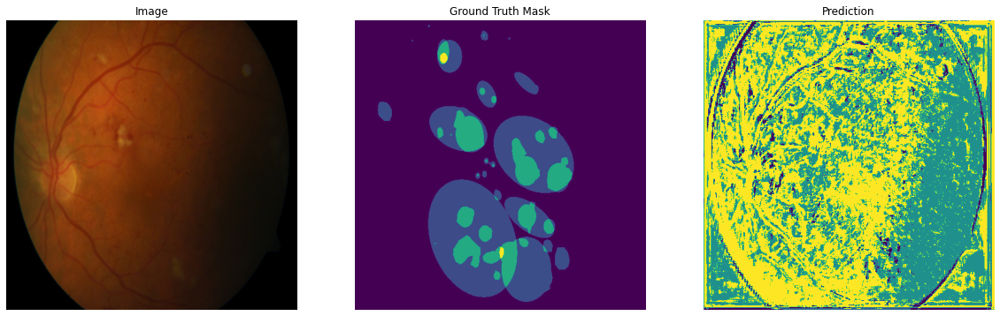

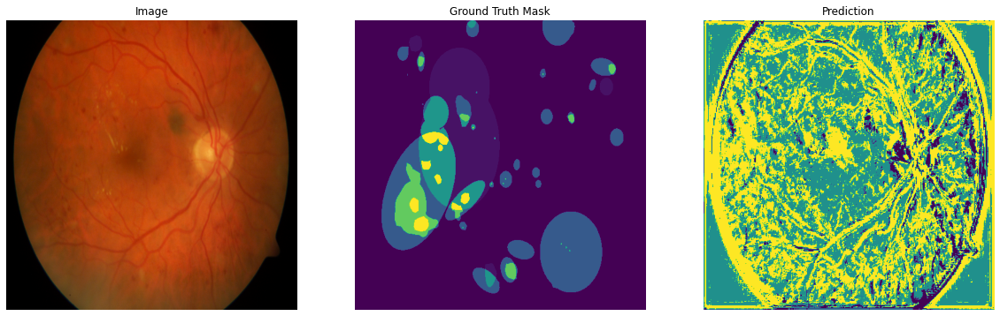

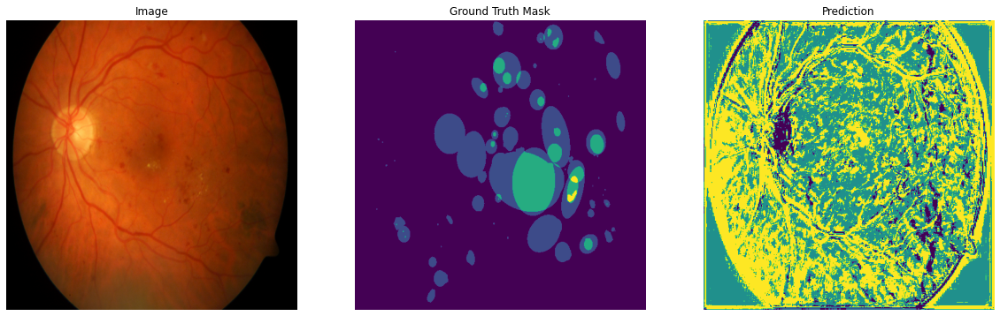

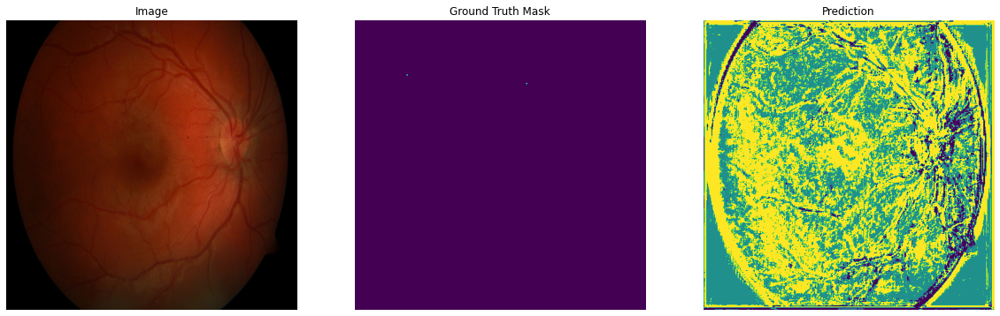

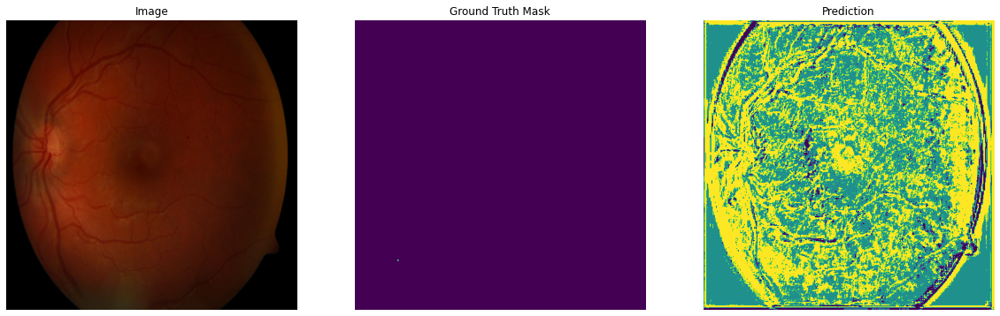

...

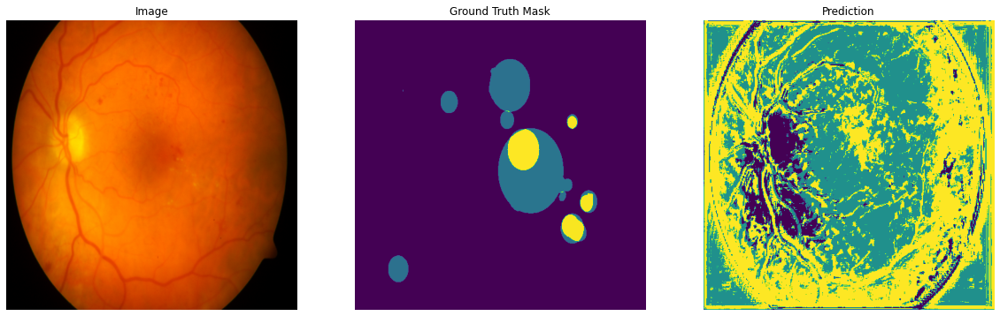

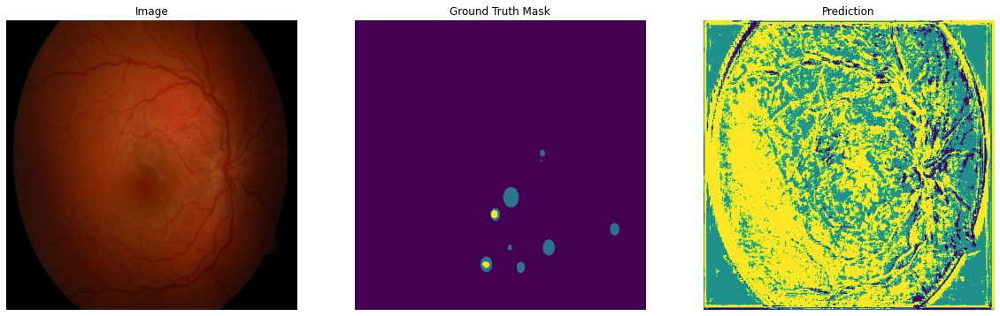

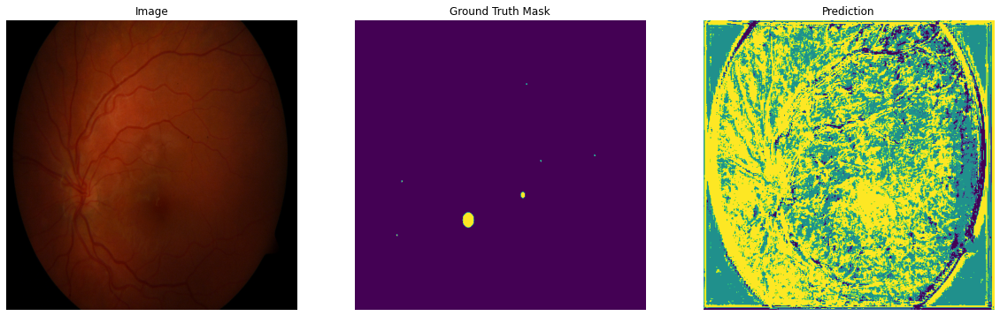

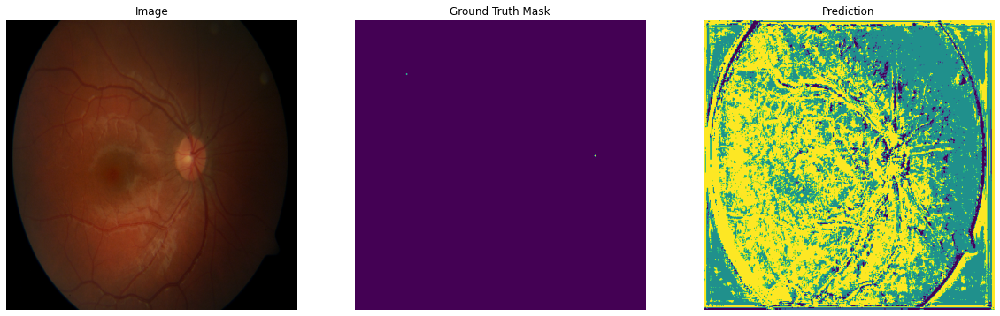

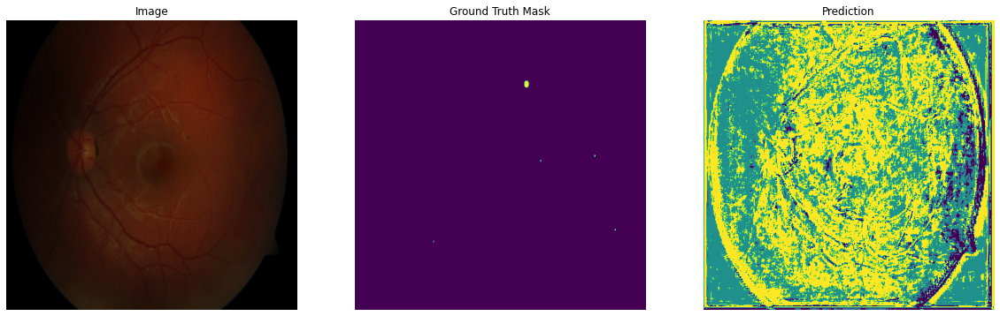

In [22]:
input_image = tf.keras.Input(shape=(512, 512, 3), name="Image")
dataset = Dataset_Generator()
model = Unet()
test_dataset = tf.data.Dataset.from_generator(
                dataset.test_generator,
                ({'Image': tf.float32},{ 'model_output':tf.int32,  'grad':tf.int32}),# cc
                ({'Image':tf.TensorShape([1, HEIGHT, WIDTH, 3])}, { 'model_output':tf.TensorShape([1,  HEIGHT, WIDTH]), 'grad':tf.TensorShape([1,5])}),
                )
predictions, classifications = model(input_image, training = True)
# print(predictions.shape)# (None, 1024, 1024, 3)

inference_model = tf.keras.Model(inputs=input_image, outputs=[predictions,classifications])# cc

for i,test in enumerate(test_dataset):
    img,mask_grad= test  
    prediction,classify = inference_model.predict(img)
    
    
    img = img["Image"][0].numpy()
    mask = mask_grad['model_output'][0].numpy()
    
    prediction = prediction[0]
    prediction = tf.math.argmax(prediction, -1)
    prediction = prediction.numpy()

    fig = plt.figure(10, figsize = (20,20))
    ax1 = fig.add_subplot(1, 3, 1)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    ax1.imshow(img)
    ax1.set_title('Image')
    ax1.axis("off")

    ax2 = fig.add_subplot(1, 3, 2)
    ax2.imshow(mask)
    ax2.set_title('Ground Truth Mask')
    ax2.axis("off")

    ax3 = fig.add_subplot(1, 3, 3)
    ax3.imshow(prediction)
    ax3.set_title('Prediction')
    ax3.axis("off")
    plt.show()
    

# 5. Training the Model and Evaluation
### - 评价指标 : Dice Coefficient, IoU

In [29]:
class MODEL():
    def __init__(self,
                 model_dir = MODEL_DIR,
                 batch_size = BATCH_SIZE,
                 width = WIDTH,
                 height = HEIGHT,
                 k = 0,
                ):
        
        self.batch_size = batch_size
        self.loss_fn = dice_coef_loss()#dice_coef_loss()#CategoricalFocalLoss() generalized_dice_loss_fun()
        self.loss_fc = CategoricalFocalLoss2()

        self.optimizer =  tf.keras.optimizers.Adam(learning_rate=0.00005)# 0.00005
        self.generator = Dataset_Generator()
        self.model_dir = MODEL_DIR
        self.optimal_k = k

        self.test_dataset = tf.data.Dataset.from_generator(
                            self.generator.test_generator,
                            ({'Image': tf.float32},{ 'model_output':tf.int32,  'grad':tf.int32}),# cc
                            ({'Image':tf.TensorShape([1, HEIGHT, WIDTH, 3])}, { 'model_output':tf.TensorShape([1,  HEIGHT, WIDTH]), 'grad':tf.TensorShape([1,5])}),
                        )
        self.width = width
        self.height = height
    
    def __del__(self):
        print("MODEL is destructed")

    def Run_training(self, epochs= EPOCHS):        
        print("Model Complie....")        
        
        # K-fold: k = 5
        K = 4
        mean_Dice = mean_IoU = 0
        DiceIoU_list = []
        for k in range(1, K+1):
            model = Unet()
            model.compile(loss = {'model_output':self.loss_fn,'grad':self.loss_fc},
                          loss_weights = [1,0.8],
                          optimizer = self.optimizer,
                          metrics = {'model_output':dice_coef,"grad":Dice_class}
#                           metrics = [Dice, Jaccard]
                          )
            callbacks_list = [tf.keras.callbacks.ModelCheckpoint(
                                        filepath=os.path.join(
                                            f"{self.model_dir}U-Net_{k}.h5"),
                                        monitor="val_model_output_Dice",
                                        mode = "max",
                                        save_best_only=True,
                                        save_weights_only=True,
                                        verbose=1,
                                        ),
                              tf.keras.callbacks.EarlyStopping(
#                                         monitor = 'loss',
                                        monitor="val_model_output_Dice",
                                        mode = "max",
                                        min_delta = 0.01,# 大于它才算是有提高
                                        patience = 5,
                                        )
                              ]
            print(f"{k}th fold Start Training....")
            
            history = model.fit(self.generator.train_generator(k),
                                steps_per_epoch = (K-1) * 67 * 2,#(K-1) * 13 * 4,
                                validation_data = self.generator.valid_generator(k),
                                validation_steps = 67 * 2,
                                callbacks = callbacks_list,
                                epochs = epochs,
                                batch_size = self.batch_size,
#                                 shuffle = True,
                                )
            
            loss = history.history['loss']
            val_loss = history.history['val_loss']
            dice = history.history["model_output_Dice"]
            val_dice = history.history["val_model_output_Dice"]
#             iou = history.history["Jaccard"]
#             val_iou = history.history["val_Jaccard"]
            iou = history.history["grad_Dice_class"]# 改成分类的metrics
            val_iou = history.history["val_grad_Dice_class"]
            
            DiceIoU_list.append( val_dice[-1] + val_iou[-1] )
            mean_Dice += val_dice[-1]
            mean_IoU += val_iou[-1]

            epochs_range = range(len(loss))
            
            plt.figure(k, figsize=(15, 5))

            plt.subplot(1, 3, 1)
            plt.plot(epochs_range, loss, label='Training Loss')
            plt.plot(epochs_range, val_loss, label='Validation Loss')
            plt.legend(loc='upper right')
            plt.title('Loss')

            plt.subplot(1, 3, 2)
            plt.plot(epochs_range, dice, label='Training Dice')
            plt.plot(epochs_range, val_dice, label='Validation Dice')
            plt.legend(loc='lower right')
            plt.title('Dice Coefficient')

            plt.subplot(1, 3, 3)
            plt.plot(epochs_range, iou, label='Training CDice')
            plt.plot(epochs_range, val_iou, label='Validation CDice')
            plt.legend(loc='lower right')
            plt.title('Classify_metics')# IoU
            plt.show()


            input_image = tf.keras.Input(shape=(self.width, self.height, 3), name="Image")
            predictions, classifications = model(input_image, training = True)
            # print(predictions.shape)# (None, 1024, 1024, 3)

            inference_model = tf.keras.Model(inputs=input_image, outputs=[predictions,classifications])# cc


            for i,test in enumerate(test_dataset):
                img,mask_grad= test  
                prediction,classify = inference_model.predict(img)    
    
                img = img["Image"][0].numpy()
                mask = mask_grad['model_output'][0].numpy()

                prediction = prediction[0]
                prediction = tf.math.argmax(prediction, -1)
                prediction = prediction.numpy()

                fig = plt.figure(10, figsize = (20,20))
                ax1 = fig.add_subplot(1, 3, 1)
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                ax1.imshow(img)
                ax1.set_title('Image')
                ax1.axis("off")

                ax2 = fig.add_subplot(1, 3, 2)
                ax2.imshow(mask)
                ax2.set_title('Ground Truth Mask')
                ax2.axis("off")

                ax3 = fig.add_subplot(1, 3, 3)
                ax3.imshow(prediction)
                ax3.set_title('Prediction')
                ax3.axis("off")
                plt.show()

                if i == 1:
                    break
            del model
        print("Training End\n\n")
        self.optimal_k = DiceIoU_list.index(max(DiceIoU_list)) + 1
        print(f"K-Fold Cross Validation Result\nmDice : {mean_Dice*20:.3f}, mIoU : {mean_IoU*20:.3f}, Optimal_K : {self.optimal_k}\n\n")

        
    def Evaluation(self, num_sample):
        input_image = tf.keras.Input(shape=(self.width, self.height, 3), name="Image")
        model = Unet()
        model.load_weights(
            f"{self.model_dir}U-Net_1.h5")

        model.compile(loss = {'model_output':self.loss_fn,'grad':self.loss_fc},
                        loss_weights = [1,0.8],
                        optimizer = self.optimizer,
                        metrics = {'model_output':Dice,"grad":Dice_class}
                      )

#         _, dice, iou = model.evaluate(self.test_dataset, batch_size = self.batch_size, verbose= 1)
#         print(f"\n\nDice : {dice*100:.3f}, IoU : {iou*100:.3f}\n\n")

        dice = model.evaluate(self.test_dataset, batch_size = self.batch_size, verbose = 1)#  _, dice, iou
        print('{}'.format(dice*100,'.3f'))


        predictions,classifications = model(input_image, training=True)
        inference_model = tf.keras.Model(inputs=input_image, outputs=[predictions,classifications])
        
        print("Display predictions")
        for i,test in enumerate(test_dataset):
            img,mask_grad= test  
            prediction,classify = inference_model.predict(img)    
    
            img = img["Image"][0].numpy()
            mask = mask_grad['model_output'][0].numpy()

            prediction = prediction[0]
            prediction = tf.math.argmax(prediction, -1)
            prediction = prediction.numpy()

            fig = plt.figure(10, figsize = (20,20))
            ax1 = fig.add_subplot(1, 3, 1)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            ax1.imshow(img)
            ax1.set_title('Image')
            ax1.axis("off")

            ax2 = fig.add_subplot(1, 3, 2)
            ax2.imshow(mask)
            ax2.set_title('Ground Truth Mask')
            ax2.axis("off")

            ax3 = fig.add_subplot(1, 3, 3)
            ax3.imshow(prediction)
            ax3.set_title('Prediction')
            ax3.axis("off")
            plt.show()

            if i == num_sample:
                break

In [ ]:
vgg_CFL = MODEL()
vgg_CFL.Run_training()

In [ ]:
# VGG16 + CFLoss
vgg_CFL = MODEL()
vgg_CFL.Evaluation(num_sample = -1)
del vgg_CFL

In [74]:
pip install numpy==1.19.5

Note: you may need to restart the kernel to use updated packages.


In [94]:
import os, cv2, random
import numpy as np

# 画图工具
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

from keras.models import Sequential
from keras.layers import Input, Dense, Conv2D, MaxPool2D , GlobalAveragePooling2D, GlobalMaxPooling2D
from keras.optimizers import Adam
from keras.callbacks import Callback, EarlyStopping, TensorBoard, ModelCheckpoint, ReduceLROnPlateau
from keras.applications.vgg16 import VGG16
from keras.models import Model
from keras.models import load_model
from keras.utils import np_utils

from keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from keras.preprocessing import image

from keras import backend as K
K.set_image_data_format('channels_last') # 数据格式data_format设置为 NHWC
from PIL import Image

In [142]:
weight_path = './Diabetic Retinopathy/U-Net_1.h5'

In [143]:
saved_model = load_model(weight_path, compile=False)

Instructions for updating:
Colocations handled automatically by placer.


In [134]:
saved_model.summary()

Model: "model_57"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
ccinput (InputLayer)            [(None, 1024, 1024,  0                                            
__________________________________________________________________________________________________
model_56 (Functional)           [(None, 32, 32, 512) 14714688    ccinput[0][0]                    
__________________________________________________________________________________________________
ccblock0_Conv0 (Conv2D)         (None, 32, 32, 512)  2359808     model_56[0][0]                   
__________________________________________________________________________________________________
ccblock0_BN0 (BatchNormalizatio (None, 32, 32, 512)  2048        ccblock0_Conv0[0][0]             
___________________________________________________________________________________________